# 1. Data Preparation

In [1]:
import pandas as pd
import numpy as np
import re

import geopandas as gpd #conda install geopandas
# conda install -c conda-forge nbformat

import plotly.express as px #conda install -c plotly plotly_express
from plotly.express import choropleth_mapbox
from shapely.geometry import shape, Point
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.feature_extraction.text import CountVectorizer
import scipy.stats

import folium

import warnings
warnings.filterwarnings("ignore")

In [2]:
df_restaurant = pd.read_csv("data/full_restaurant_rating_data.csv")
df_is_in_mall = pd.read_csv("data/restaurant_is_in_mall.csv")
df_walking_duration_from_station_exit = pd.read_csv("data/restaurant_walking_duration_from_station_exit.csv")
df_restaurant_nearest_exit = pd.read_csv('data/restaurant_nearest_station_exit.csv')

In [3]:
subset_columns = [
    'name',
    'address',
    'region',
    'latitude',
    'longitude',
    'nearby_attraction',
    'distance_from_attraction',
    'num_of_rating_1',
    'num_of_rating_2',
    'num_of_rating_3',
    'num_of_rating_4',
    'num_of_rating_5',
    'overall_rating',
    'num_of_reviews',
    'url'
]

df_restaurant_subset = df_restaurant[subset_columns].copy()

In [4]:
df_restaurant_subset = df_restaurant_subset.merge(df_is_in_mall[['url', 'is_in_mall', 'mall']], on='url', how='left')
df_restaurant_subset = df_restaurant_subset.merge(df_walking_duration_from_station_exit, on='url', how='left')
df_restaurant_subset = df_restaurant_subset.merge(df_restaurant_nearest_exit[['station_name', 'station_line_color', 'url', 'distance']], on='url', how='left')

# 2. Basic Data Summary

### Group (General) 

- Number of Missing Ratings
- Number of Restaurants Ratings < 20

In [5]:
df_restaurant_subset['overall_rating'].value_counts().sort_index() / len(df_restaurant_subset) * 100

-1.0    13.367978
 1.0     0.671983
 1.5     0.286713
 2.0     1.200609
 2.5     2.033868
 3.0     9.237524
 3.5    17.202760
 4.0    32.774841
 4.5    15.231610
 5.0     7.992115
Name: overall_rating, dtype: float64

##### Handle Missing Ratings

In [6]:
############# Drop Ratings = -1
df_restaurant_subset = df_restaurant_subset[df_restaurant_subset['overall_rating'] != -1].copy()
df_restaurant_subset['overall_rating'].value_counts().sort_index() / len(df_restaurant_subset) * 100 

1.0     0.775675
1.5     0.330955
2.0     1.385872
2.5     2.347709
3.0    10.662943
3.5    19.857276
4.0    37.832247
4.5    17.581963
5.0     9.225359
Name: overall_rating, dtype: float64

In [7]:
########### Potentially: 4.5 / 5.0: Outstanding, 4.0: Average, 3.5 and below: Below Average
print(f"Total Observations:{len(df_restaurant_subset)}")
print(f"Below Average: {len(df_restaurant_subset[df_restaurant_subset['overall_rating'] < 4.0]) * 100 / len(df_restaurant_subset)}%")
print(f"Average: {len(df_restaurant_subset[df_restaurant_subset['overall_rating'] == 4.0]) * 100 / len(df_restaurant_subset)}%")
print(f"Outstanding: {len(df_restaurant_subset[df_restaurant_subset['overall_rating'] >= 4.5]) * 100 / len(df_restaurant_subset)}%")

Total Observations:9669
Below Average: 35.360430240976314%
Average: 37.832247388561385%
Outstanding: 26.807322370462302%


##### Handle Too Low Number of Reviews

In [8]:
def percentile(n):
    '''
    Calculate Percentile
    To be used in Groupbys
    '''
    def percentile_(x):
        return np.percentile(x, n)
    percentile_.__name__ = 'percentile_%s' % n
    return percentile_

In [9]:
# Average number of reviews is 46, but it can be seen that 75 percentile is 31. Which means that most restaurants have number of reviews < mean

df_restaurant_subset['num_of_reviews'].describe()

count    9669.000000
mean       46.610818
std       149.768247
min         1.000000
25%         2.000000
50%         8.000000
75%        31.000000
max      7148.000000
Name: num_of_reviews, dtype: float64

In [10]:
# Restaurant of higher ratings have a higher number of reviews in general

df_restaurant_subset.groupby('overall_rating').agg({'num_of_reviews': ['count', 'min', 'mean', 'max', percentile(25), percentile(50), percentile(75)]})

num_of_reviews                                     \
                        count min       mean   max percentile_25   
overall_rating                                                     
1.0                        75   1   1.746667    16           1.0   
1.5                        32   2  20.125000   284           2.0   
2.0                       134   1  10.201493   518           1.0   
2.5                       227   2  12.876652   429           3.0   
3.0                      1031   1  17.390883   880           2.0   
3.5                      1920   2  37.593750  1252           5.0   
4.0                      3658   1  54.285402  1879           2.0   
4.5                      1700   1  85.100000  7148           4.0   
5.0                       892   1  13.743274  1653           1.0   

                                            
               percentile_50 percentile_75  
overall_rating                              
1.0                      1.0          2.00  
1.5                      3.0          5.25  
2.0                      2.0          5.00  
2.5                      4.0         10.00  
3.0                      5.0         14.00  
3.5                     15.0         38.25  
4.0                     11.0         47.75  
4.5                      9.0         41.00  
5.0                      1.0          4.00

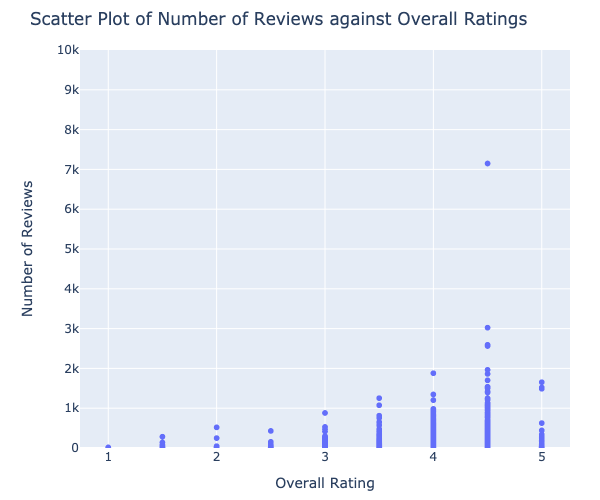

In [11]:
### Outlier: 7148 reviews restaurant [Maybe have a closer exploration of why this restaurant has such a high rating?]

fig = px.scatter(
    y = df_restaurant_subset["num_of_reviews"],
    x = df_restaurant_subset["overall_rating"],
    labels=dict(x="Overall Rating", y="Number of Reviews")
)

fig.update_layout(title="Scatter Plot of Number of Reviews against Overall Ratings")
fig.update_layout(height=500, width=600, yaxis_range=[0,10000], margin={'r': 30, 'l': 80, 'b': 50, 't': 50},)
fig.show("png")

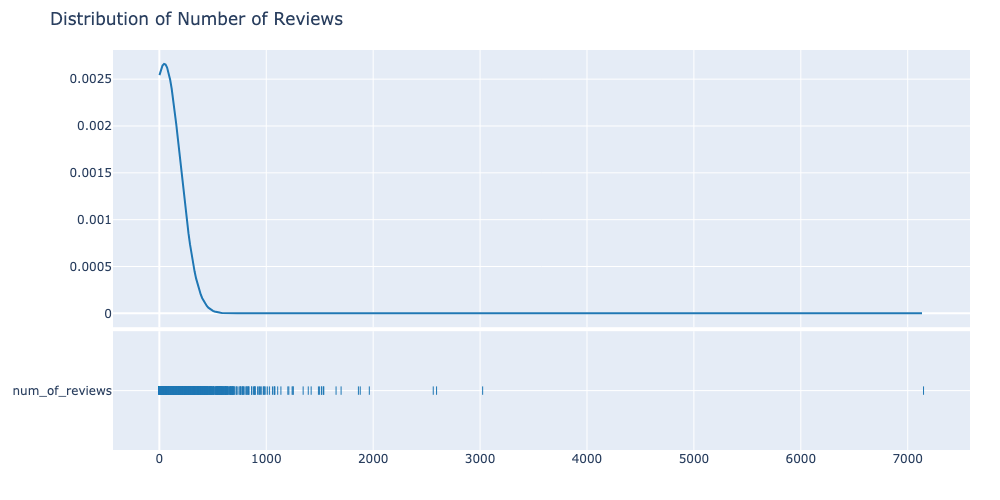

In [12]:
fig = make_subplots(
    rows=2,
    cols=1,
    vertical_spacing=0.01,
    row_heights=[0.7,0.3],
    shared_xaxes=True
)

fig1 = ff.create_distplot(
    [df_restaurant_subset['num_of_reviews']], 
    show_hist=False, 
    show_rug=False, 
    curve_type='normal', 
    group_labels= ['num_of_reviews'],
)

fig2 = ff.create_distplot(
    [df_restaurant_subset['num_of_reviews']], 
    show_hist=False,
    show_curve=False, 
    show_rug=True, 
    curve_type='normal', 
    group_labels= ['num_of_reviews']
)

for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig2.data:
    fig.add_trace(trace, row=2, col=1)

# fig2.update_xaxes(title="Number of Reviews")
# fig2.update_yaxes(title="Probability Density")
fig.update_layout(title="Distribution of Number of Reviews", showlegend=False)
fig.update_layout(height=500, width=1000, margin={'r': 30, 'l': 80, 'b': 50, 't': 50})
fig.show("png")

In [13]:
### Resolution 1: Cap at 8 [Min]

df_restaurant_subset[df_restaurant_subset['num_of_reviews'] >= 8].groupby('overall_rating').agg({'num_of_reviews': ['count', 'min', 'mean', 'max', percentile(25), percentile(50), percentile(75)]})

num_of_reviews                                      \
                        count min        mean   max percentile_25   
overall_rating                                                      
1.0                         2   8   12.000000    16          10.0   
1.5                         5  12  111.400000   284          46.0   
2.0                        24   8   46.208333   518           9.0   
2.5                        69   8   34.579710   429          11.0   
3.0                       421   8   38.657957   880          11.0   
3.5                      1276   8   54.525862  1252          15.0   
4.0                      2136   8   91.008895  1879          15.0   
4.5                       936   8  151.470085  7148          13.0   
5.0                       112   8   96.651786  1653          11.0   

                                            
               percentile_50 percentile_75  
overall_rating                              
1.0                     12.0          14.0  
1.5                     76.0         139.0  
2.0                     12.5          22.5  
2.5                     18.0          32.0  
3.0                     18.0          36.0  
3.5                     27.0          60.0  
4.0                     35.0          97.0  
4.5                     32.0         118.0  
5.0                     20.5          54.5

In [14]:
df_num_of_reviews_capped = df_restaurant_subset[df_restaurant_subset['num_of_reviews'] >= 8].copy()

########### Potentially: 4.5 / 5.0: Outstanding, 4.0: Average, 3.5 and below: Below Average
print(f"Total Observations:{len(df_num_of_reviews_capped)}")
print(f"Below Average: {len(df_num_of_reviews_capped[df_num_of_reviews_capped['overall_rating'] < 4.0]) * 100 / len(df_num_of_reviews_capped)}%")
print(f"Average: {len(df_num_of_reviews_capped[df_num_of_reviews_capped['overall_rating'] == 4.0]) * 100 / len(df_num_of_reviews_capped)}%")
print(f"Outstanding: {len(df_num_of_reviews_capped[df_num_of_reviews_capped['overall_rating'] >= 4.5]) * 100 / len(df_num_of_reviews_capped)}%")

Total Observations:4981
Below Average: 36.07709295322224%
Average: 42.88295522987352%
Outstanding: 21.039951816904235%


In [15]:
df_num_of_reviews_capped["computed_rating"] = df_num_of_reviews_capped[["num_of_rating_1", "num_of_rating_2", "num_of_rating_3", "num_of_rating_4","num_of_rating_5"]].apply(
    lambda x: ((x["num_of_rating_1"] * 1) + (x["num_of_rating_2"] * 2) + 
    (x["num_of_rating_3"] * 3) + (x["num_of_rating_4"] * 4) + 
    (x["num_of_rating_5"] * 5)) /
    (x["num_of_rating_1"] + x["num_of_rating_2"] + x["num_of_rating_3"] + x["num_of_rating_4"] + x["num_of_rating_5"])
    , axis=1
)

In [16]:
df_num_of_reviews_capped['computed_rating'].describe()

count    4977.000000
mean        3.852004
std         0.518586
min         1.000000
25%         3.560976
50%         3.894737
75%         4.197943
max         5.000000
Name: computed_rating, dtype: float64

### Food Chain / BBT Chain concern
- Find duplicates in Name of restaurants

In [17]:
df_food_chain = df_restaurant.copy()

In [18]:
df_food_chain["cleaned_name"] = df_food_chain["name"].apply(
    lambda x: re.search(".+(?=\(.*\))", x).group().lower() if re.search(".+(?=\(.*\))", x) else x.lower()
)

In [19]:
df_food_chain['cleaned_name'].value_counts().sort_values(ascending=False).head(20)

subway             68
mcdonald's         62
kfc                38
liho tea           37
pezzo              29
pizza hut          29
burger king        26
thai express       23
sakae sushi        21
kimly dim sum      21
swensen's          20
starbucks          20
saizeriya          19
the soup spoon     19
toast box          17
din tai fung       17
dunkin' donuts     16
old chang kee      16
rong kee           16
twelve cupcakes    15
Name: cleaned_name, dtype: int64

In [20]:
# Chain Store like Twelve Cupcakes / LIHO are gone 
### We move

df_num_of_reviews_capped['name'].value_counts().sort_values(ascending=False).head(20)

Subway              18
Din Tai Fung        14
Dian Xiao Er        10
McDonald's          10
Burger King         10
Haidilao Hot Pot     9
Thai Express         9
Toast Box            8
Ichiban Boshi        8
Swensen's            7
Sushi Tei            7
Seoul Garden         7
Pizza Hut            7
Tim Ho Wan           7
Nakhon Kitchen       7
Cedele               7
Menya Musashi        6
Putien               6
Poulet               6
Jack's Place         6
Name: name, dtype: int64

### Specific to My Part

- Number of Missing/Wrong Geolocations
- Number of Missing Walking Durations from Train Stations
- Number of Inside Shopping Malls vs Number of Not Inside Malls

In [21]:
print(f"Total Rows: {len(df_num_of_reviews_capped)}")
print(f"Good Geolocations: {len(df_num_of_reviews_capped[df_num_of_reviews_capped['longitude'] > 100])}")
print(f"Bad Geolocations: {len(df_num_of_reviews_capped[df_num_of_reviews_capped['longitude'] < 100])}")
print(f"Missing Geolocations: {len(df_num_of_reviews_capped[df_num_of_reviews_capped['longitude'].isna()])}")


Total Rows: 4981
Good Geolocations: 4969
Bad Geolocations: 0
Missing Geolocations: 12


In [22]:
print(f"Missing Walking Duration: {len(df_num_of_reviews_capped[df_num_of_reviews_capped['walking_duration'].isna()])}")

Missing Walking Duration: 13


In [23]:
### Throw away Missing Geolocation / Walking Duration [KIV]
df_num_of_reviews_capped = df_num_of_reviews_capped.dropna(subset=['walking_distance'])

In [24]:
### Is In Mall likely a good enough feature by itself


df_num_of_reviews_capped['is_in_mall'].value_counts()

False    3738
True     1230
Name: is_in_mall, dtype: int64

- Most common regions (provided by Tripadvisor)
- Most common MRT/Train station exit
- Most common Mall

In [25]:
# No clear assignment of region names by TripAdvisor --> Many regions like City Hall, Marina Bay, Central Business District can be assigned to Central Area/City Area

print(f"Total Number of TripAdvisor Regions: {len(df_num_of_reviews_capped['region'].value_counts())}")
print(df_num_of_reviews_capped['region'].value_counts().head(20) / len(df_num_of_reviews_capped) * 100)

Total Number of TripAdvisor Regions: 125
Central Area/City Area       20.954106
Outram                       10.104670
Boulevard                     5.132850
Bukit Merah                   3.985507
Somerset                      3.603060
Marine Parade                 3.059581
Marina Centre                 2.999195
City Hall                     2.495974
Changi                        2.475845
Bedok                         2.214171
Tanglin                       2.133655
Lavender                      1.912238
Moulmein                      1.731079
Marina Bay                    1.710950
Serangoon                     1.429147
Museum                        1.328502
Robertson Quay                1.308374
Central Business District     1.268116
Little India                  1.207729
Jurong East                   1.187601
Name: region, dtype: float64


In [26]:
# No clear assignment of region names by TripAdvisor --> Many regions like City Hall, Marina Bay, Central Business District can be assigned to Central Area/City Area

print(f"Total Number of Malls: {len(df_num_of_reviews_capped['mall'].value_counts())}")
print(df_num_of_reviews_capped['mall'].value_counts().head(20) / len(df_num_of_reviews_capped) * 100)

Total Number of Malls: 119
Suntec City         1.247987
Marina Square       1.107085
Plaza Singapura     1.026570
Ion Orchard         0.966184
Raffles City        0.825282
Ngee Ann City       0.825282
Bugis Junction      0.785024
Marina Bay Sands    0.764895
Orchard Central     0.644122
City Square Mall    0.603865
The Paragon         0.583736
Millenia Walk       0.563607
Nex                 0.503221
Wisma Atria         0.483092
Westgate            0.462963
The Star Vista      0.442834
Parkway Parade      0.422705
The Centrepoint     0.422705
Great World City    0.422705
Jurong Point        0.422705
Name: mall, dtype: float64


In [27]:
print(f"Total Number of Stations: {len(df_num_of_reviews_capped['station_name'].value_counts())}")
print(df_num_of_reviews_capped['station_name'].value_counts().head(20) / len(df_num_of_reviews_capped) * 100)
print(df_num_of_reviews_capped['station_line_color'].value_counts() / len(df_num_of_reviews_capped) * 100)

Total Number of Stations: 134
ORCHARD MRT STATION           7.145733
BUGIS MRT STATION             4.448470
TANJONG PAGAR MRT STATION     4.347826
SOMERSET MRT STATION          4.287440
CHINATOWN MRT STATION         3.522544
CLARKE QUAY MRT STATION       3.482287
ESPLANADE MRT STATION         3.260870
TELOK AYER MRT STATION        2.858293
RAFFLES PLACE MRT STATION     2.777778
OUTRAM PARK MRT STATION       2.777778
FARRER PARK MRT STATION       2.677134
HARBOURFRONT MRT STATION      2.536232
FORT CANNING MRT STATION      2.415459
PROMENADE MRT STATION         2.274557
EUNOS MRT STATION             2.254428
CITY HALL MRT STATION         2.173913
NOVENA MRT STATION            2.113527
CHANGI AIRPORT MRT STATION    1.892110
DAKOTA MRT STATION            1.690821
TIONG BAHRU MRT STATION       1.690821
Name: station_name, dtype: float64
GREEN     29.106280
BLUE      18.860709
YELLOW    18.599034
RED       17.652979
PURPLE    11.171498
OTHERS     4.609501
Name: station_line_color, dtype: fl

In [28]:
### Station Exit / Mall / Region - Need to strike a balance between these 3

### A plan is to use Geospatial Analysis to re-assign new Region
# --> this new Region will be able to take care of these 3 information (Station Exit, Mall, Region)

# 3. Basic Correlation / Trends

- Walking Distance
- In-Mall
- Overall Rating

#### Walking Distance

Walking Distance vs Overall Rating

In [29]:
scipy.stats.pearsonr(df_num_of_reviews_capped['walking_distance'], df_num_of_reviews_capped['overall_rating'])

(0.004569933934099327, 0.7474314552063525)

Walking Distance vs Is In Mall

In [30]:
scipy.stats.pearsonr(df_num_of_reviews_capped['walking_distance'], df_num_of_reviews_capped['is_in_mall'])

(-0.09604160477284696, 1.1739472229141126e-11)

In [31]:
fig = px.violin(
    x = df_num_of_reviews_capped['is_in_mall'],
    y = df_num_of_reviews_capped['walking_distance']
)

fig.show()

#### Is In Mall

Is In Mall vs Overall Rating

In [32]:
scipy.stats.pearsonr(df_num_of_reviews_capped['is_in_mall'], df_num_of_reviews_capped['overall_rating'])

(-0.16147908234802288, 2.243349653431031e-30)

In [33]:
fig = px.violin(
    x = df_num_of_reviews_capped['is_in_mall'],
    y = df_num_of_reviews_capped['overall_rating']
)

fig.show()

#### Summary
- To Review after cleaning Regions

In [34]:
# is in mall -> lower walking distance
# is in mall -> lower overall rating

# higher walking distance -> no change to overall rating

np.corrcoef([
    df_num_of_reviews_capped['is_in_mall'],
    df_num_of_reviews_capped['walking_distance'],
    df_num_of_reviews_capped['overall_rating']
])

array([[ 1.        , -0.0960416 , -0.16147908],
       [-0.0960416 ,  1.        ,  0.00456993],
       [-0.16147908,  0.00456993,  1.        ]])

# 4. Geospatial Analysis

In [35]:
gdf_restaurant = gpd.GeoDataFrame(df_num_of_reviews_capped, geometry= gpd.points_from_xy(df_num_of_reviews_capped['longitude'], df_num_of_reviews_capped['latitude']), crs='epsg:4326')

In [36]:
gdf_subzones = gpd.read_file('data/singapore_subzones_2019.geojson', crs='epsg:4326')
gdf_subzones['extracted_description'] = gdf_subzones['Description'].apply(
    lambda x: re.findall("(?<=<td>)[\w*\s*\-*]*\w+(?=</td>)", x)
)

In [37]:
def extract_district(x):
    if len(x) > 0:
        if len(x[3]) == 1:
            return x[1]
        else:
            np.nan
    else:
        return np.nan

def extract_town(x):
    if len(x) > 0:
        if len(x[3]) == 1:
            return x[4]
        else:
            return x[3]
    else:
        return np.nan

def extract_region(x):
    if len(x) > 0:
        if len(x[3]) == 1:
            return x[6]
        else:
            return x[5]
    else:
        return np.nan

gdf_subzones['district'] = gdf_subzones['extracted_description'].apply(lambda x: extract_district(x))
gdf_subzones['town'] = gdf_subzones['extracted_description'].apply(lambda x: extract_town(x))
gdf_subzones['area'] = gdf_subzones['extracted_description'].apply(lambda x: extract_region(x))        

gdf_subzones.drop(columns=['Name', 'Description', 'extracted_description'], inplace=True)

In [38]:
gdf_subzones.groupby('area').agg({'town': ['count'], 'district': ['count']})

,town,district
,count,count
area,,
CENTRAL REGION,135,130
EAST REGION,30,30
NORTH REGION,41,41
NORTH-EAST REGION,48,48
WEST REGION,78,76


In [39]:
gdf_restaurant = gpd.sjoin(
    gdf_restaurant,
    gdf_subzones,
    how='left',
)

gdf_restaurant.drop(columns=['index_right'], inplace=True)

Handling Missing Geolocations

In [40]:
gdf_restaurant_missing_location = gdf_restaurant[gdf_restaurant['area'].isna()].copy()
gdf_restaurant_missing_location

,name,address,region,latitude,longitude,nearby_attraction,distance_from_attraction,num_of_rating_1,num_of_rating_2,num_of_rating_3,...,walking_distance,walking_duration,station_name,station_line_color,distance,computed_rating,geometry,district,town,area
2537,Goldenbeach Seafood Paradise,907 East Coast Road #01-01 Springvale Springva...,NaN,1.391251,103.97471,NaN,NaN,3,2,1,...,6161.8,4436.4,PASIR RIS MRT STATION,GREEN,3481.244390,3.840000,POINT (103.97471 1.39125),NaN,NaN,NaN
2754,Rasa Istimewa,"6A Admiralty Road West Waterfront Park, Singap...",NaN,1.453914,103.77774,Singapore Zoo,5.8,2,1,8,...,2895.9,2085.0,WOODLANDS MRT STATION,RED,2116.644183,3.714286,POINT (103.77774 1.45391),NaN,NaN,NaN
2815,Patro's Sports Bar & Restaurant,920 East Coast Parkway Parkland Green #01-18/1...,NaN,1.298121,103.90860,East Coast Park,0.7,8,1,8,...,3001.7,2161.2,EUNOS MRT STATION,GREEN,2441.963490,3.673077,POINT (103.90860 1.29812),NaN,NaN,NaN


In [41]:
# lat, lon
f = folium.Figure(height=200, width=300)
m = folium.Map(location=[gdf_restaurant_missing_location.loc[2537,'latitude'], gdf_restaurant_missing_location.loc[2537,'longitude']], zoom_start=20).add_to(f)
folium.Marker([gdf_restaurant_missing_location.loc[2537,'latitude'], gdf_restaurant_missing_location.loc[2537,'longitude']], popup=gdf_restaurant_missing_location.loc[2537,'name']).add_to(m)
layer = folium.Choropleth(gdf_subzones, columns=['district', 'town', 'area'], fill_opacity=0.4).add_to(m)
folium.GeoJsonTooltip(['district', 'town','area']).add_to(layer.geojson)
f

In [42]:
# lat, lon
f = folium.Figure(height=200, width=300)
m = folium.Map(location=[gdf_restaurant_missing_location.loc[2754,'latitude'], gdf_restaurant_missing_location.loc[2754,'longitude']], zoom_start=15).add_to(f)
folium.Marker([gdf_restaurant_missing_location.loc[2754,'latitude'], gdf_restaurant_missing_location.loc[2754,'longitude']], popup=gdf_restaurant_missing_location.loc[2754,'name']).add_to(m)
layer = folium.Choropleth(gdf_subzones, columns=['district', 'town', 'area'], fill_opacity=0.4).add_to(m)
folium.GeoJsonTooltip(['district', 'town','area'], show=True).add_to(layer.geojson)
f

In [43]:
# lat, lon
f = folium.Figure(height=200, width=300)
m = folium.Map(location=[gdf_restaurant_missing_location.loc[2815,'latitude'], gdf_restaurant_missing_location.loc[2815,'longitude']], zoom_start=20).add_to(f)
folium.Marker([gdf_restaurant_missing_location.loc[2815,'latitude'], gdf_restaurant_missing_location.loc[2815,'longitude']], popup=gdf_restaurant_missing_location.loc[2815,'name']).add_to(m)
layer = folium.Choropleth(gdf_subzones, columns=['district', 'town', 'area'], fill_opacity=0.4).add_to(m)
folium.GeoJsonTooltip(['district', 'town','area'], sticky=True).add_to(layer.geojson)
f

In [44]:
gdf_restaurant.loc[2537, 'district'] = 'CHANGI POINT'
gdf_restaurant.loc[2537, 'town'] = 'CHANGI'
gdf_restaurant.loc[2537, 'area'] = 'EAST REGION'

gdf_restaurant.loc[2754, 'district'] = 'NORTH COAST'
gdf_restaurant.loc[2754, 'town'] = 'WOODLANDS'
gdf_restaurant.loc[2754, 'area'] = 'NORTH REGION'

gdf_restaurant.loc[2815, 'district'] = 'MARINE PARADE'
gdf_restaurant.loc[2815, 'town'] = 'MARINE PARADE'
gdf_restaurant.loc[2815, 'area'] = 'CENTRAL REGION'

In [45]:
gdf_restaurant.groupby('station_line_color').agg({
    'url': ['count'],
    'walking_distance': ['min', percentile(25), percentile(50), percentile(75), 'max', 'mean'],
    'overall_rating': ['min', percentile(25), percentile(50), percentile(75), 'max', 'mean'],
}).sort_values(('walking_distance', 'mean'), ascending=False)

url walking_distance                              \
                   count              min percentile_25 percentile_50   
station_line_color                                                      
OTHERS               229              3.5       309.500        778.10   
YELLOW               924              0.9       305.675        455.70   
GREEN               1446              2.1       261.925        431.65   
RED                  877              0.4       218.200        353.70   
BLUE                 937              0.3       184.500        290.00   
PURPLE               555              0.5       208.050        329.90   

                                                       overall_rating  \
                   percentile_75      max         mean            min   
station_line_color                                                      
OTHERS                    1345.7  16700.1  2747.444541            2.0   
YELLOW                     969.5   5235.4   794.425257            2.0   
GREEN                      887.6   6161.8   721.367427            1.5   
RED                        670.9  10649.6   553.827024            1.0   
BLUE                       469.7   5307.4   405.432231            1.0   
PURPLE                     435.0   1971.6   382.220541            1.5   

                                                                             
                   percentile_25 percentile_50 percentile_75  max      mean  
station_line_color                                                           
OTHERS                       3.5           4.0           4.0  5.0  3.775109  
YELLOW                       3.5           4.0           4.0  5.0  3.831169  
GREEN                        3.5           4.0           4.0  5.0  3.887275  
RED                          3.5           4.0           4.0  5.0  3.821551  
BLUE                         3.5           4.0           4.5  5.0  3.970651  
PURPLE                       3.5           4.0           4.0  5.0  3.841441

Mapbox Token

In [46]:
mapbox_token =''

Feature Engineer a new "Region" (override TripAdvisor's)

In [47]:
df_region_area_rating = gdf_restaurant.groupby(['area']).agg({
    'url': ['count'],
    'overall_rating': ['mean'],
}).sort_values(('overall_rating', 'mean'), ascending=False)

df_region_area_rating.columns = df_region_area_rating.columns.droplevel(1)
df_region_area_rating.reset_index(drop=False, inplace=True)
df_region_area_rating.rename(columns={
    'url': 'num_of_restaurants',
    'overall_rating': 'average_rating',
}, inplace=True)

gdf_area = gdf_subzones.dissolve(by='area').reset_index(drop=False)[['district', 'town', 'area', 'geometry']]
df_region_area_rating = df_region_area_rating.merge(gdf_area, on='area', how='left')
gdf_region_area_rating = gpd.GeoDataFrame(df_region_area_rating, geometry='geometry', crs='epsg:4326')

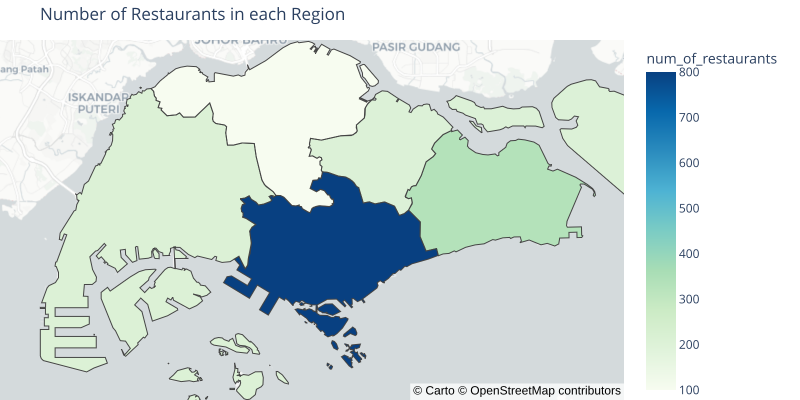

In [48]:
fig = px.choropleth_mapbox(
    gdf_region_area_rating,
    geojson = gdf_region_area_rating.geometry,
    locations = gdf_region_area_rating.index,
    color='num_of_restaurants',
    color_continuous_scale='gnbu',
    range_color=(100,800),
    hover_data=['district', 'town', 'area'],
    width=800,
    height=400,
    center= {
        'lat': 1.33,
        'lon': 103.82
    },
    zoom=9.8 # 11.2 for CBD
)

fig.update_layout(
    title="Number of Restaurants in each Region",
    margin={'r': 0, 'l': 0, 'b': 0, 't': 40},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

"Breaking Down" the Southern and Eastern Regions

In [49]:
df_region_town_rating = gdf_restaurant.groupby(['town']).agg({
    'url': ['count'],
    'overall_rating': ['mean'],
}).sort_values(('overall_rating', 'mean'), ascending=False)

df_region_town_rating.columns = df_region_town_rating.columns.droplevel(1)
df_region_town_rating.reset_index(drop=False, inplace=True)
df_region_town_rating.rename(columns={
    'url': 'num_of_restaurants',
    'overall_rating': 'average_rating',
}, inplace=True)

gdf_town = gdf_subzones.dissolve(by='town').reset_index(drop=False)[['town', 'area', 'geometry']]
gdf_region_town_rating = df_region_town_rating.merge(gdf_town, on='town', how='left')
gdf_region_town_rating = gpd.GeoDataFrame(gdf_region_town_rating, geometry='geometry', crs='epsg:4326')

In [50]:
gdf_region_town_rating_central = gdf_region_town_rating[gdf_region_town_rating['area'] == 'CENTRAL REGION']
gdf_region_town_rating_east = gdf_region_town_rating[gdf_region_town_rating['area'] == 'EAST REGION']

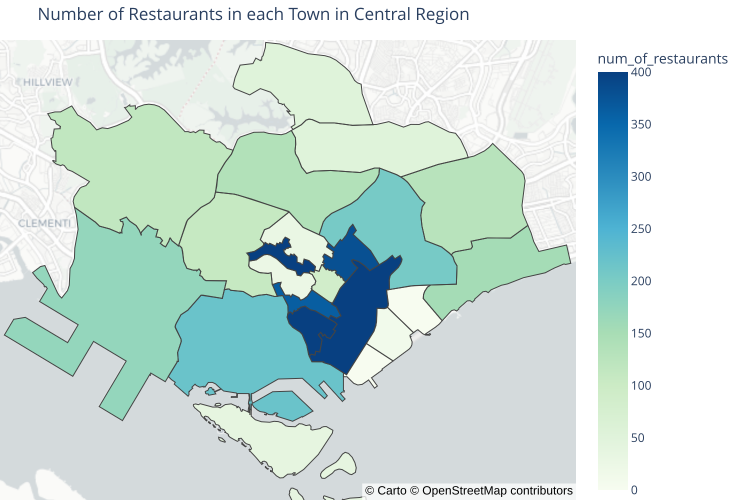

In [51]:
fig = px.choropleth_mapbox(
    gdf_region_town_rating_central,
    geojson = gdf_region_town_rating_central.geometry,
    locations = gdf_region_town_rating_central.index,
    color='num_of_restaurants',
    color_continuous_scale='gnbu',
    range_color=(0,400),
    hover_data=['town', 'area'],
    width=750,
    height=500,
    center= {
        'lat': 1.3,
        'lon': 103.835
    },
    zoom=11.2 # 11.2 for CBD
)

fig.update_layout(
    title="Number of Restaurants in each Town in Central Region",
    margin={'r': 0, 'l': 0, 'b': 0, 't': 40},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

# BISHAN + TOA PAYOH
# MUSUEM + ROCHOR
# RIVER VALLEY + SINGAPORE RIVER
# NEWTON + ORCHARD
# MARINE PARADE + MARINA EAST + MARINA SOUTH + STRAITS VIEW
# BUKIT MERAH, SOUTHERN ISLANDS

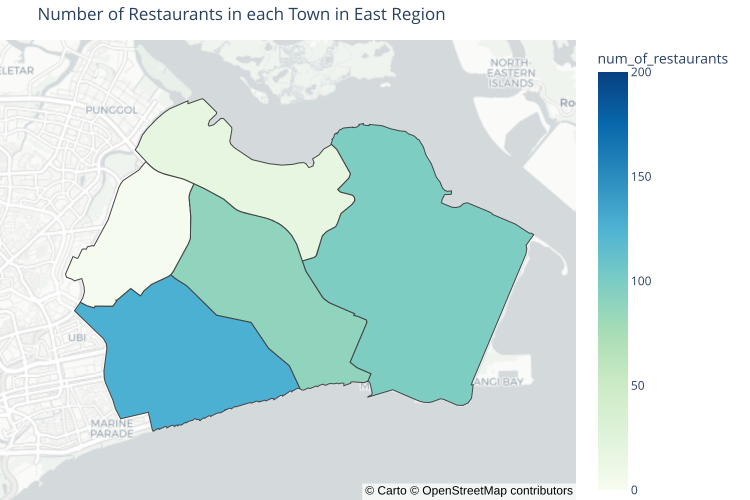

In [52]:
fig = px.choropleth_mapbox(
    gdf_region_town_rating_east,
    geojson = gdf_region_town_rating_east.geometry,
    locations = gdf_region_town_rating_east.index,
    color='num_of_restaurants',
    color_continuous_scale='gnbu',
    range_color=(0,200),
    hover_data=['town', 'area'],
    width=750,
    height=500,
    center= {
        'lat': 1.35,
        'lon': 103.96
    },
    zoom=11.2 # 11.2 for CBD
)

fig.update_layout(
    title="Number of Restaurants in each Town in East Region",
    margin={'r': 0, 'l': 0, 'b': 0, 't': 40},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

# PAYA LEBAR + TAMPINES + PASIR RIS

In [53]:
df_region_district_rating = gdf_restaurant.groupby(['district']).agg({
    'url': ['count'],
    'overall_rating': ['mean'],
}).sort_values(('overall_rating', 'mean'), ascending=False)

df_region_district_rating.columns = df_region_district_rating.columns.droplevel(1)
df_region_district_rating.reset_index(drop=False, inplace=True)
df_region_district_rating.rename(columns={
    'url': 'num_of_restaurants',
    'overall_rating': 'average_rating',
}, inplace=True)

gdf_district = gdf_subzones.dissolve(by='district').reset_index(drop=False)[['district', 'town', 'area', 'geometry']]
df_region_district_rating = df_region_district_rating.merge(gdf_district, on='district', how='left')
gdf_region_district_rating = gpd.GeoDataFrame(df_region_district_rating, geometry='geometry', crs='epsg:4326')

In [54]:
gdf_region_district_rating_downtown = gdf_region_district_rating[gdf_region_district_rating['town'] == 'DOWNTOWN CORE']

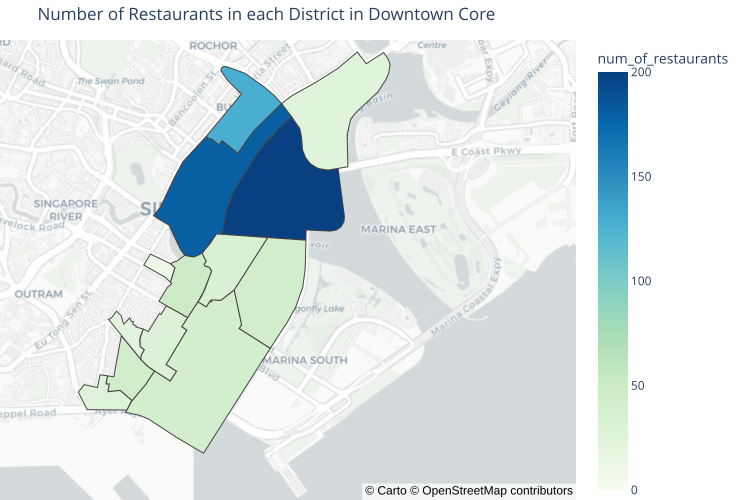

In [55]:
fig = px.choropleth_mapbox(
    gdf_region_district_rating_downtown,
    geojson = gdf_region_district_rating_downtown.geometry,
    locations = gdf_region_district_rating_downtown.index,
    color='num_of_restaurants',
    color_continuous_scale='gnbu',
    range_color=(0,200),
    hover_data=['town', 'area', 'district'],
    width=750,
    height=500,
    center= {
        'lat': 1.285,
        'lon': 103.86
    },
    zoom=12.95 # 11.2 for CBD
)

fig.update_layout(
    title="Number of Restaurants in each District in Downtown Core",
    margin={'r': 0, 'l': 0, 'b': 0, 't': 40},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

# BUGIS + CITY HALL
# MARINA CENTRE + NICOLL
# REMAINING --> Downtown Core

Feature Engineer: New Region Label

In [56]:
# ---------------------------------------------- #
gdf_town_paya_lebar_tampines_pasir_ris = gdf_town[gdf_town['town'].isin([
    'PAYA LEBAR', 'TAMPINES', 'PASIR RIS'])]

gdf_town_paya_lebar_tampines_pasir_ris = gdf_town_paya_lebar_tampines_pasir_ris.dissolve('area').reset_index(drop=False)
gdf_town_paya_lebar_tampines_pasir_ris.loc[0, 'town'] = 'PAYA LEBAR, TAMPINES, PASIR RIS'

# ---------------------------------------------- #
gdf_town_bishan_toa_payoh = gdf_town[gdf_town['town'].isin([
    'BISHAN', 'TOA PAYOH'])]

gdf_town_bishan_toa_payoh = gdf_town_bishan_toa_payoh.dissolve('area').reset_index(drop=False)
gdf_town_bishan_toa_payoh.loc[0, 'town'] = 'BISHAN, TOA PAYOH'

# ---------------------------------------------- #
gdf_town_rochor = gdf_town[gdf_town['town'].isin([
    'MUSEUM', 'ROCHOR'])]

gdf_town_rochor = gdf_town_rochor.dissolve('area').reset_index(drop=False)
gdf_town_rochor.loc[0, 'town'] = 'ROCHOR'

# ---------------------------------------------- #
gdf_town_singapore_river = gdf_town[gdf_town['town'].isin([
    'RIVER VALLEY', 'SINGAPORE RIVER'])]

gdf_town_singapore_river = gdf_town_singapore_river.dissolve('area').reset_index(drop=False)
gdf_town_singapore_river.loc[0, 'town'] = 'SINGAPORE RIVER'

# ---------------------------------------------- #
gdf_town_newtown_orchard = gdf_town[gdf_town['town'].isin([
    'NEWTON', 'ORCHARD'])]

gdf_town_newtown_orchard = gdf_town_newtown_orchard.dissolve('area').reset_index(drop=False)
gdf_town_newtown_orchard.loc[0, 'town'] = 'NEWTON, ORCHARD'

# ---------------------------------------------- #
gdf_town_bukit_merah_southern_islands = gdf_town[gdf_town['town'].isin([
    'BUKIT MERAH', 'SOUTHERN ISLANDS'])]

gdf_town_bukit_merah_southern_islands = gdf_town_bukit_merah_southern_islands.dissolve('area').reset_index(drop=False)
gdf_town_bukit_merah_southern_islands.loc[0, 'town'] = 'BUKIT MERAH, SOUTHERN ISLANDS'

# ---------------------------------------------- #
gdf_town_marina_bay = gdf_town[gdf_town['town'].isin([
    'MARINE PARADE', 'MARINA EAST', 'MARINA SOUTH', 'STRAITS VIEW'])]

gdf_town_marina_bay = gdf_town_marina_bay.dissolve('area').reset_index(drop=False)
gdf_town_marina_bay.loc[0, 'town'] = 'MARINA BAY'

# ---------------------------------------------- #
gdf_district_bugis_city_hall = gdf_district[gdf_district['district'].isin([
    'BUGIS', 'CITY HALL'])]

gdf_district_bugis_city_hall = gdf_district_bugis_city_hall.dissolve('area').reset_index(drop=False)
gdf_district_bugis_city_hall.loc[0, 'district'] = 'BUGIS, CITY HALL'

# ---------------------------------------------- #
gdf_district_marina_centre = gdf_district[gdf_district['district'].isin([
    'NICOLL', 'MARINA CENTRE'])]

gdf_district_marina_centre = gdf_district_marina_centre.dissolve('area').reset_index(drop=False)
gdf_district_marina_centre.loc[0, 'district'] = 'MARINA CENTRE'

# ---------------------------------------------- #
gdf_district_downtown = gdf_district[
    ~(gdf_district['district'].isin(['NICOLL', 'MARINA CENTRE', 'BUGIS', 'CITY HALL'])) &
    (gdf_district['town'] == 'DOWNTOWN CORE')
]

gdf_district_downtown = gdf_district_downtown.dissolve('area').reset_index(drop=False)
gdf_district_downtown.loc[0, 'district'] = 'DOWNTOWN'

Existing

In [57]:
gdf_area_excluding_central_east = gdf_area[~gdf_area['area'].isin(['EAST REGION', 'CENTRAL REGION'])]
gdf_area_excluding_central_east = gdf_area_excluding_central_east[['geometry', 'area']].rename(columns={'area': 'new_region'})

# ---------------------------------------------- #
gdf_town_changi_bedok = gdf_town[gdf_town['town'].isin([
                                'CHANGI', 'BEDOK'])]

gdf_town_changi_bedok = gdf_town_changi_bedok[['town', 'geometry']].rename(columns={'town': 'new_region'})                               

# ---------------------------------------------- #
gdf_town_central =gdf_town[
    (gdf_town['area'] == 'CENTRAL REGION') &
    ~(gdf_town['town'].isin([
        'BISHAN', 'TOA PAYOH', 'MUSEUM', 'ROCHOR', 'RIVER VALLEY',
        'SINGAPORE RIVER', 'NEWTON', 'ORCHARD', 'MARINE PARADE', 'MARINA EAST',
        'MARINA SOUTH', 'STRAITS VIEW', 'BUKIT MERAH', 'SOUTHERN ISLANDS','DOWNTOWN CORE'
    ]))
]

gdf_town_central = gdf_town_central[['town', 'geometry']].rename(columns={'town': 'new_region'})

In [58]:
gdf_new_region = pd.concat([
    gdf_area_excluding_central_east,
    gdf_town_changi_bedok,
    gdf_town_central,
    gdf_town_paya_lebar_tampines_pasir_ris[['town', 'geometry']].rename(columns={'town': 'new_region'}),
    gdf_town_bishan_toa_payoh[['town', 'geometry']].rename(columns={'town': 'new_region'}),
    gdf_town_rochor[['town', 'geometry']].rename(columns={'town': 'new_region'}),
    gdf_town_singapore_river[['town', 'geometry']].rename(columns={'town': 'new_region'}),
    gdf_town_newtown_orchard[['town', 'geometry']].rename(columns={'town': 'new_region'}),
    gdf_town_bukit_merah_southern_islands[['town', 'geometry']].rename(columns={'town': 'new_region'}),
    gdf_town_marina_bay[['town', 'geometry']].rename(columns={'town': 'new_region'}),
    gdf_district_bugis_city_hall[['district', 'geometry']].rename(columns={'district': 'new_region'}),
    gdf_district_marina_centre[['district', 'geometry']].rename(columns={'district': 'new_region'}),
    gdf_district_downtown[['district', 'geometry']].rename(columns={'district': 'new_region'}),
])

gdf_new_region.reset_index(drop=True, inplace=True)

In [59]:
gdf_restaurant = gpd.sjoin(
    gdf_restaurant,
    gdf_new_region,
    how='left',
)

gdf_restaurant.drop(columns=['index_right'], inplace=True)
gdf_restaurant.loc[2537, 'new_region'] = 'CHANGI'
gdf_restaurant.loc[2754, 'new_region'] = 'NORTH REGION'
gdf_restaurant.loc[2815, 'new_region'] = 'MARINA BAY'

In [60]:
df_new_region = gdf_restaurant.groupby(['new_region']).agg({
    'url': ['count'],
    'mall': ['count'],
    'walking_distance': ['mean'],
    'computed_rating': ['mean'],
    'overall_rating': ['mean'],
}).sort_values(('overall_rating', 'mean'), ascending=False)

df_new_region.columns = df_new_region.columns.droplevel(1)
df_new_region.reset_index(drop=False, inplace=True)
df_new_region.rename(columns={
    'url': 'num_of_restaurants',
    'overall_rating': 'average_rating',
}, inplace=True)

In [61]:
df_new_region.sort_values(['average_rating'], ascending=False)

,new_region,num_of_restaurants,mall,walking_distance,computed_rating,average_rating
0,OUTRAM,504,7,279.414881,4.049517,4.064484
1,TANGLIN,108,0,1766.499074,3.937803,3.967593
2,DOWNTOWN,299,83,310.818729,3.923699,3.949833
3,"BUGIS, CITY HALL",308,111,267.765584,3.919238,3.939935
4,KALLANG,205,41,376.060488,3.878304,3.914634
5,ROCHOR,468,85,311.190812,3.900399,3.903846
6,GEYLANG,128,5,714.559375,3.847766,3.902344
7,BEDOK,127,11,1232.861417,3.890978,3.881890
8,SINGAPORE RIVER,389,26,497.258869,3.861955,3.876607
9,BUKIT TIMAH,115,10,546.632174,3.849908,3.869565


In [62]:
gdf_new_region = gdf_new_region.merge(df_new_region, on='new_region', how='left')

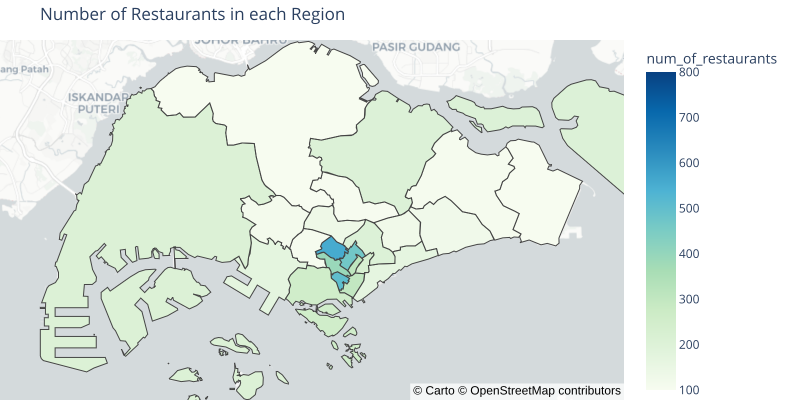

In [63]:
fig = px.choropleth_mapbox(
    gdf_new_region,
    geojson = gdf_new_region.geometry,
    locations = gdf_new_region.index,
    color='num_of_restaurants',
    color_continuous_scale='gnbu',
    range_color=(100,800),
    hover_data=['new_region'],
    width=800,
    height=400,
    center= {
        'lat': 1.33,
        'lon': 103.82
    },
    zoom=9.8 # 11.2 for CBD
)

fig.update_layout(
    title="Number of Restaurants in each Region",
    margin={'r': 0, 'l': 0, 'b': 0, 't': 40},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

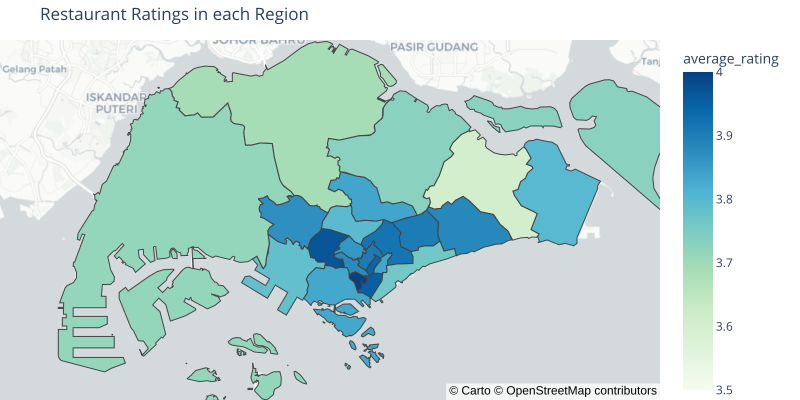

In [64]:
fig = px.choropleth_mapbox(
    gdf_new_region,
    geojson = gdf_new_region.geometry,
    locations = gdf_new_region.index,
    color='average_rating',
    color_continuous_scale='gnbu',
    range_color=(3.5,4),
    hover_data=['new_region'],
    width=800,
    height=400,
    center= {
        'lat': 1.33,
        'lon': 103.82
    },
    zoom=9.8 # 11.2 for CBD
)

fig.update_layout(
    title="Restaurant Ratings in each Region",
    margin={'r': 0, 'l': 0, 'b': 0, 't': 40},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

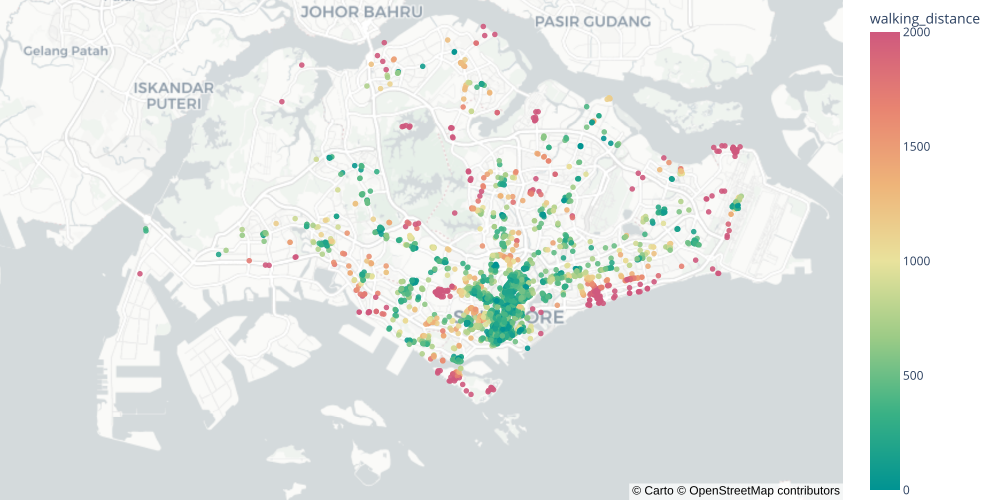

In [65]:
fig = px.scatter_mapbox(
    gdf_restaurant,
    lat=gdf_restaurant.geometry.y,
    lon=gdf_restaurant.geometry.x,
    color='walking_distance',
    color_continuous_scale='temps',
    opacity=0.9,
    width=1000,
    height=500,
    center= {
        'lat': 1.33,
        'lon': 103.8
    },
    range_color=(0,2000),
    hover_data=['station_name', 'station_line_color'],
    # radius=3,
    zoom=10.2 # 11.2 for CBD
)

fig.update_layout(
    margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

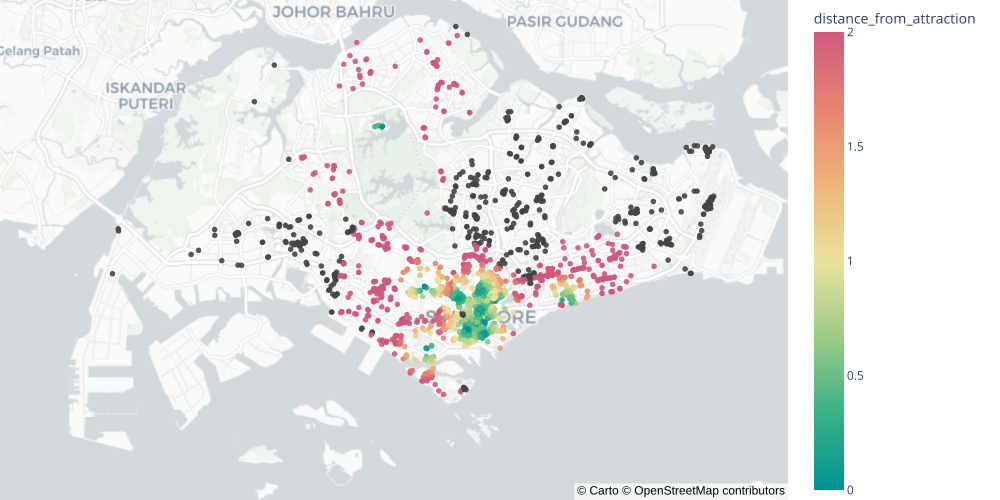

In [66]:
fig = px.scatter_mapbox(
    gdf_restaurant,
    lat=gdf_restaurant.geometry.y,
    lon=gdf_restaurant.geometry.x,
    color='distance_from_attraction',
    color_continuous_scale='temps',
    opacity=0.9,
    width=1000,
    height=500,
    center= {
        'lat': 1.33,
        'lon': 103.8
    },
    range_color=(0,2),
    hover_data=['nearby_attraction'],
    # radius=3,
    zoom=10.2 # 11.2 for CBD
)

fig.update_layout(
    margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
    mapbox_accesstoken=mapbox_token,
    mapbox= {'style': 'carto-positron'}
)
fig.show("svg")

In [67]:
gdf_restaurant.columns

Index(['name', 'address', 'region', 'latitude', 'longitude',
       'nearby_attraction', 'distance_from_attraction', 'num_of_rating_1',
       'num_of_rating_2', 'num_of_rating_3', 'num_of_rating_4',
       'num_of_rating_5', 'overall_rating', 'num_of_reviews', 'url',
       'is_in_mall', 'mall', 'walking_distance', 'walking_duration',
       'station_name', 'station_line_color', 'distance', 'computed_rating',
       'geometry', 'district', 'town', 'area', 'new_region'],
      dtype='object')

# Drafts

District

In [53]:
df_region_district_rating = gdf_restaurant.groupby(['district']).agg({
    'url': ['count'],
    'overall_rating': ['mean'],
}).sort_values(('overall_rating', 'mean'), ascending=False)

df_region_district_rating.columns = df_region_district_rating.columns.droplevel(1)
df_region_district_rating.reset_index(drop=False, inplace=True)
df_region_district_rating.rename(columns={
    'url': 'num_of_restaurants',
    'overall_rating': 'average_rating',
}, inplace=True)

gdf_district = gdf_subzones.dissolve(by='district').reset_index(drop=False)[['district', 'town', 'area', 'geometry']]
df_region_district_rating = df_region_district_rating.merge(gdf_district, on='district', how='left')
gdf_region_district_rating = gpd.GeoDataFrame(df_region_district_rating, geometry='geometry', crs='epsg:4326')

In [71]:
# fig = px.choropleth_mapbox(
#     gdf_region_district_rating,
#     geojson = gdf_region_district_rating.geometry,
#     locations = gdf_region_district_rating.index,
#     color='num_of_restaurants',
#     color_continuous_scale='gnbu',
#     range_color=(0,50),
#     hover_data=['district', 'town', 'area'],
#     width=1000,
#     height=500,
#     center= {
#         'lat': 1.33,
#         'lon': 103.8
#     },
#     zoom=10.2 # 11.2 for CBD
# )

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token,
#     mapbox= {'style': 'carto-positron'}
# )
# fig.show()

In [72]:
# fig = px.choropleth_mapbox(
#     gdf_region_district_rating,
#     geojson = gdf_region_district_rating.geometry,
#     locations = gdf_region_district_rating.index,
#     color='average_rating',
#     color_continuous_scale='gnbu',
#     range_color=(3.6,4),
#     hover_data=['district', 'town', 'area'],
#     width=1000,
#     height=500,
#     center= {
#         'lat': 1.33,
#         'lon': 103.8
#     },
#     zoom=10.2 # 11.2 for CBD
# )

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token,
#     mapbox= {'style': 'carto-positron'}
# )
# fig.show()

Town

In [58]:
df_region_town_rating = gdf_restaurant.groupby(['town']).agg({
    'url': ['count'],
    'overall_rating': ['mean'],
}).sort_values(('overall_rating', 'mean'), ascending=False)

df_region_town_rating.columns = df_region_town_rating.columns.droplevel(1)
df_region_town_rating.reset_index(drop=False, inplace=True)
df_region_town_rating.rename(columns={
    'url': 'num_of_restaurants',
    'overall_rating': 'average_rating',
}, inplace=True)

gdf_town = gdf_subzones.dissolve(by='town').reset_index(drop=False)[['town', 'area', 'geometry']]
gdf_region_town_rating = df_region_town_rating.merge(gdf_town, on='town', how='left')
gdf_region_town_rating = gpd.GeoDataFrame(gdf_region_town_rating, geometry='geometry', crs='epsg:4326')

In [73]:
# fig = px.choropleth_mapbox(
#     gdf_region_town_rating,
#     geojson = gdf_region_town_rating.geometry,
#     locations = gdf_region_town_rating.index,
#     color='num_of_restaurants',
#     color_continuous_scale='gnbu',
#     range_color=(0,200),
#     hover_data=['town', 'area'],
#     width=1000,
#     height=500,
#     center= {
#         'lat': 1.33,
#         'lon': 103.8
#     },
#     zoom=10.2 # 11.2 for CBD
# )

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token,
#     mapbox= {'style': 'carto-positron'}
# )
# fig.show()

In [74]:
# fig = px.choropleth_mapbox(
#     gdf_region_town_rating,
#     geojson = gdf_region_town_rating.geometry,
#     locations = gdf_region_town_rating.index,
#     color='average_rating',
#     color_continuous_scale='gnbu',
#     range_color=(3.5,4.0),
#     hover_data=['town'],
#     width=1000,
#     height=500,
#     center= {
#         'lat': 1.33,
#         'lon': 103.8
#     },
#     zoom=10.2 # 11.2 for CBD
# )

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token,
#     mapbox= {'style': 'carto-positron'}
# )
# fig.show()

Area

In [61]:
# df_region_area_rating = gdf_restaurant.groupby(['area']).agg({
#     'url': ['count'],
#     'overall_rating': ['mean'],
# }).sort_values(('overall_rating', 'mean'), ascending=False)

In [62]:
# df_region_area_rating.columns = df_region_area_rating.columns.droplevel(1)
# df_region_area_rating.reset_index(drop=False, inplace=True)
# df_region_area_rating.rename(columns={
#     'url': 'num_of_restaurants',
#     'overall_rating': 'average_rating',
# }, inplace=True)

In [63]:
# gdf_area = gdf_subzones.dissolve(by='area').reset_index(drop=False)[['district', 'town', 'area', 'geometry']]
# df_region_area_rating = df_region_area_rating.merge(gdf_area, on='area', how='left')
# gdf_region_area_rating = gpd.GeoDataFrame(df_region_area_rating, geometry='geometry', crs='epsg:4326')

In [75]:
# fig = px.choropleth_mapbox(
#     gdf_region_area_rating,
#     geojson = gdf_region_area_rating.geometry,
#     locations = gdf_region_area_rating.index,
#     color='num_of_restaurants',
#     color_continuous_scale='gnbu',
#     range_color=(0,500),
#     hover_data=['district', 'town', 'area'],
#     width=1000,
#     height=500,
#     center= {
#         'lat': 1.33,
#         'lon': 103.8
#     },
#     zoom=10.2 # 11.2 for CBD
# )

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token,
#     mapbox= {'style': 'carto-positron'}
# )
# fig.show()

In [76]:
# fig = px.choropleth_mapbox(
#     gdf_region_area_rating,
#     geojson = gdf_region_area_rating.geometry,
#     locations = gdf_region_area_rating.index,
#     color='average_rating',
#     color_continuous_scale='gnbu',
#     range_color=(3.6,4),
#     hover_data=['district', 'town', 'area'],
#     width=1000,
#     height=500,
#     center= {
#         'lat': 1.33,
#         'lon': 103.8
#     },
#     zoom=10.2 # 11.2 for CBD
# )

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token,
#     mapbox= {'style': 'carto-positron'}
# )
# fig.show()

Feature Engineer the Region

In [68]:
# gdf_region_area_rating

,area,num_of_restaurants,average_rating,district,town,geometry
0,CENTRAL REGION,4142,3.897393,MARINA EAST,MARINA EAST,"MULTIPOLYGON Z (((103.83211 1.21705 0.00000, 1..."
1,EAST REGION,333,3.765766,SIGLAP,BEDOK,"MULTIPOLYGON Z (((103.91826 1.30747 0.00000, 1..."
2,NORTH-EAST REGION,205,3.729268,SERANGOON CENTRAL,SERANGOON,"MULTIPOLYGON Z (((103.92805 1.41967 0.00000, 1..."
3,WEST REGION,207,3.714976,JURONG ISLAND AND BUKOM,WESTERN ISLANDS,"MULTIPOLYGON Z (((103.64692 1.29098 0.00000, 1..."
4,NORTH REGION,78,3.692308,PANG SUA,SUNGEI KADUT,"MULTIPOLYGON Z (((103.81882 1.39434 0.00000, 1..."


In [70]:
gdf_region_town_rating[gdf_region_town_rating['area'] == 'CENTRAL REGION']

,town,num_of_restaurants,average_rating,area,geometry
0,OUTRAM,504,4.064484,CENTRAL REGION,"POLYGON Z ((103.84852 1.28221 0.00000, 103.848..."
1,NEWTON,28,4.017857,CENTRAL REGION,"POLYGON Z ((103.84827 1.30488 0.00000, 103.848..."
2,STRAITS VIEW,1,4.000000,CENTRAL REGION,"POLYGON Z ((103.86269 1.26976 0.00000, 103.859..."
7,TANGLIN,108,3.967593,CENTRAL REGION,"POLYGON Z ((103.82900 1.29898 0.00000, 103.829..."
8,SOUTHERN ISLANDS,38,3.947368,CENTRAL REGION,"MULTIPOLYGON Z (((103.84061 1.22873 0.00000, 1..."
9,ROCHOR,380,3.947368,CENTRAL REGION,"POLYGON Z ((103.85404 1.30269 0.00000, 103.854..."
10,RIVER VALLEY,26,3.923077,CENTRAL REGION,"POLYGON Z ((103.84194 1.29440 0.00000, 103.841..."
11,DOWNTOWN CORE,833,3.914766,CENTRAL REGION,"POLYGON Z ((103.86159 1.28765 0.00000, 103.861..."
12,KALLANG,205,3.914634,CENTRAL REGION,"POLYGON Z ((103.86596 1.29429 0.00000, 103.865..."
13,GEYLANG,128,3.902344,CENTRAL REGION,"POLYGON Z ((103.88972 1.30859 0.00000, 103.889..."


In [66]:
# fig = px.density_mapbox(
#     gdf_restaurant,
#     lat=gdf_restaurant.geometry.y,
#     lon=gdf_restaurant.geometry.x,
#     # color='overall_rating',
#     color_continuous_scale=px.colors.sequential.Inferno,
#     opacity=0.5,
#     width=1000,
#     height=500,
#     center= {
#         'lat': 1.33,
#         'lon': 103.8
#     },
#     range_color=(1,5),
#     radius=3,
#     zoom=10.2 # 11.2 for CBD
# )

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token,
#     mapbox= {'style': 'carto-positron'}
# )
# fig.show()

- Basic Scattermapbox of Restaurant Ratings and Location
- Scattermapbox of MRT exit's Restaurant Ratings and Number of Restaurants
- Scattermapbox of Mall's Restaurant Ratings and Number of Restaurants
- Heatmap of Restaurant Ratings (experiment with different radius)

- Experimenting with Buffering to decide on better region boundaries

In [48]:
# target_lat = 1.35
# target_lng = 103.8

# fig = px.scatter_mapbox(
#     gdf_restaurant,
#     lat=gdf_restaurant.latitude,
#     lon=gdf_restaurant.longitude,
#     color='overall_rating',
#     hover_name='name',
#     mapbox_style='carto-positron',
#     zoom=10.4,
#     center={'lat': target_lat, 'lon': target_lng}
# )

# fig.update_traces(marker=dict(size=8))

# fig.update_layout(
#     margin={'r': 0, 'l': 0, 'b': 0, 't': 0},
#     mapbox_accesstoken=mapbox_token
# )
# fig.show()

In [56]:
# ----------------- FOLIUM CODES FOR REFERENCE ------------------ #

# import folium

# # lat, lon
# m = folium.Map(location=[1.290260, 103.839190], zoom_start=20)

# folium.Marker([1.290260, 103.839190], popup="Altman").add_to(m)

# folium.Circle(
#     radius=100,
#     location=[1.290260, 103.839190],
#     popup="Vicinity",
#     color="#3186cc",
#     fill=True,
#     fill_color="#3186cc",
# ).add_to(m)

# m2 = folium.Map(location=[1.290260, 103.839190], zoom_start=10)
# folium.Choropleth(
#     geo_data=gdf_region.loc[0, 'geometry']   
# ).add_to(m2)

In [ ]:
# gdf_region = gpd.read_file('data/singapore_regions_2019.geojson', crs='epsg:4326')
# gdf_region['area'] = gdf_region['Description'].apply(
#     lambda x: re.search("(?<=<td>).+(?<=\sREGION)", x).group()
# )
# gdf_region.drop(columns=['Name', 'Description'], inplace=True)
# gdf_region